In [14]:
import cv2

from xview3.constants import NODATA_VH_DB
import numpy as np
from xview3 import read_tiff
import albumentations as A
import matplotlib.pyplot as plt
from xview3 import pseudocolor_heatmap

#vh_fname = "../data/tiny/train/05bc615a9b0e1159t/VH_dB.tif"
#vv_fname = "../data/tiny/train/05bc615a9b0e1159t/VV_dB.tif"

vh_fname = "../data/tiny/train/72dba3e82f782f67t/VH_dB.tif"
vv_fname = "../data/tiny/train/72dba3e82f782f67t/VV_dB.tif"

image = np.dstack([read_tiff(vv_fname), read_tiff(vh_fname)])
image = A.CenterCrop(1024, 1024)(image=image)["image"]
image[10:20,10:20] = float("nan")
vv,vh = image[..., 0], image[..., 1]

In [15]:
def image_hist(vv,vh):

    f, ax = plt.subplots(2,2,figsize=(16,10),gridspec_kw={'height_ratios': [4, 1]})

    ax[0,0].imshow(vv)
    ax[0,0].axis('off')
    ax[0,0].set_title('vv')

    ax[1,0].hist(vv.reshape(-1), vv.shape[1])
    ax[1,0].axis('on')

    ax[0,1].imshow(vh)
    ax[0,1].axis('off')
    ax[0,1].set_title('vh')

    ax[1,1].hist(vh.reshape(-1), vh.shape[1])
    ax[1,1].axis('on')

    f.tight_layout()
    f.show()

In [16]:
import torch

def sigmoid_normalization(x, midpoint=-20, temperature=0.18):
    x = torch.from_numpy(x)
    xs = (x - midpoint) * temperature
    return xs.sigmoid().numpy()

In [27]:
from xview3.augmentations import UnclippedRandomBrightnessContrast
aug = UnclippedRandomBrightnessContrast(
    brightness_limit=(-5, 5),
    contrast_limit=0.2,
    p=1,
    image_in_log_space=True)
aug

UnclippedRandomBrightnessContrast(always_apply=False, p=1, brightness_limit=(-5, 5), contrast_limit=(-0.2, 0.2), image_in_log_space=True)

<ipython-input-15-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



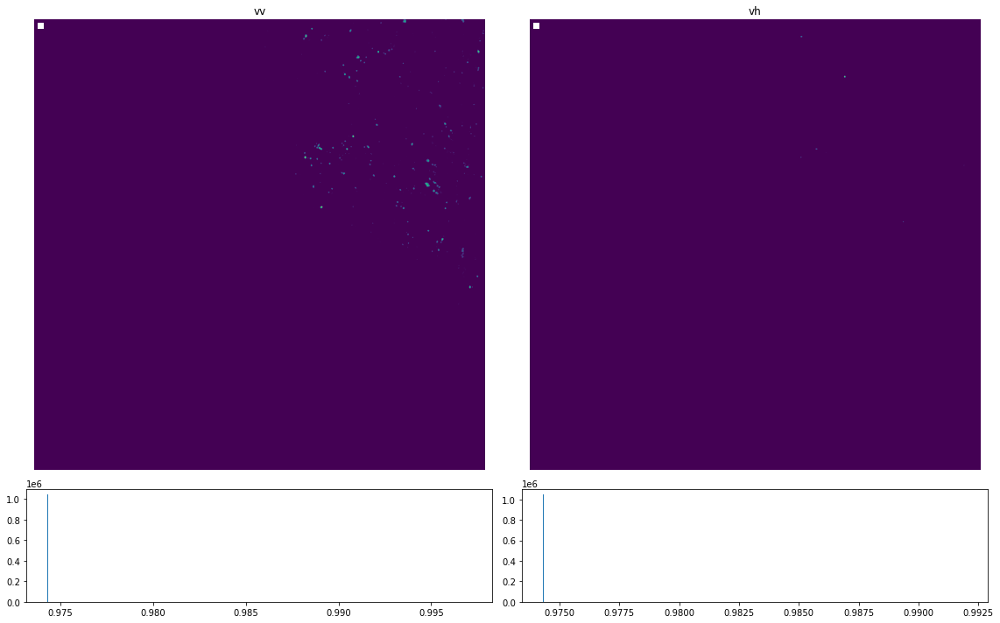

In [28]:
augmented = sigmoid_normalization(aug(image=np.dstack([vv,vh]))["image"])
image_hist(augmented[..., 0], augmented[..., 1])

D:\Develop\Kaggle\xView3\xview3\augmentations\unclipped_random_brightness.py:35: RuntimeWarning:

invalid value encountered in log10

<ipython-input-15-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



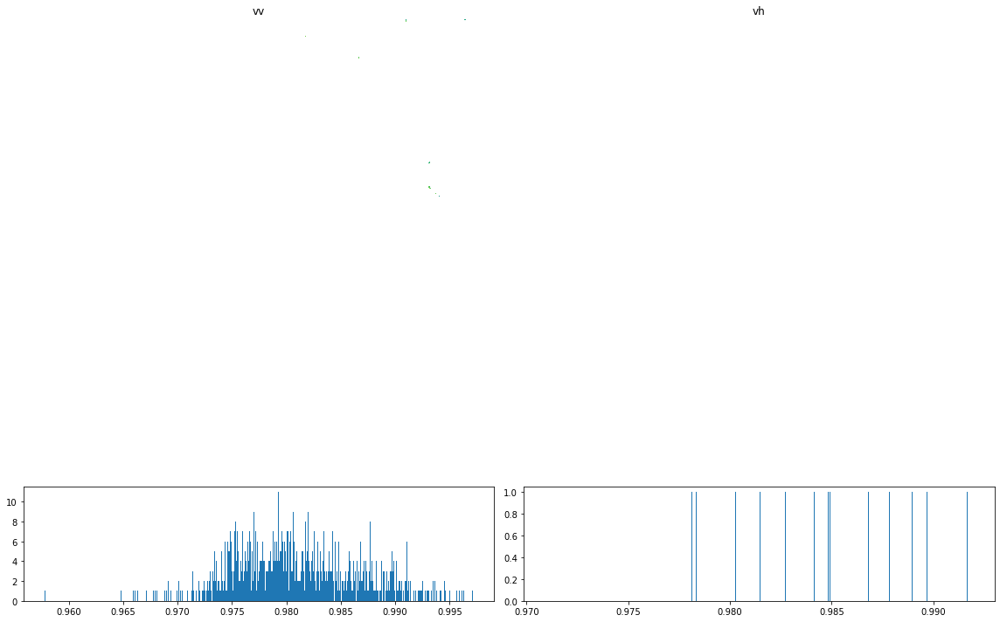

In [29]:
augmented = sigmoid_normalization(aug(image=np.dstack([vv,vh]))["image"])
image_hist(augmented[..., 0], augmented[..., 1])

<ipython-input-15-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



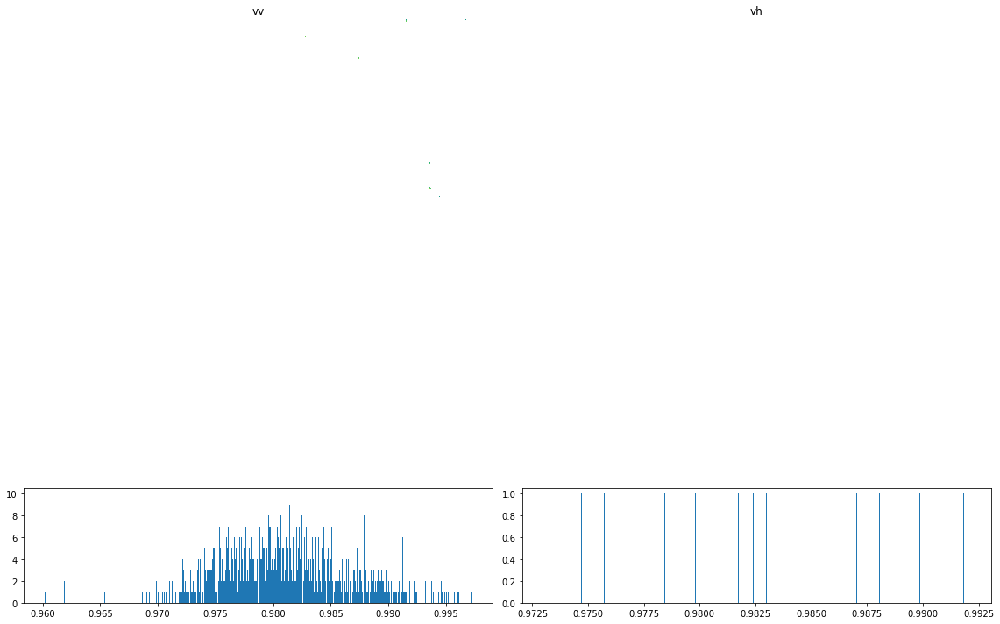

In [30]:
augmented = sigmoid_normalization(aug(image=np.dstack([vv,vh]))["image"])
image_hist(augmented[..., 0], augmented[..., 1])

<ipython-input-15-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



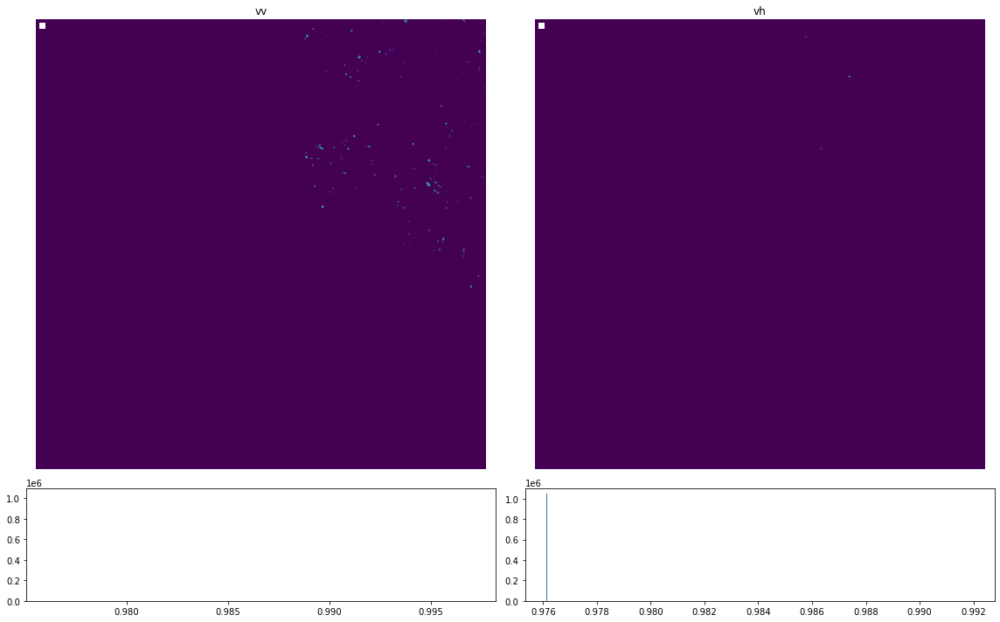

In [31]:
augmented = sigmoid_normalization(aug(image=np.dstack([vv,vh]))["image"])
image_hist(augmented[..., 0], augmented[..., 1])

In [22]:
from xview3.augmentations import UnclippedGaussNoise
noise = UnclippedGaussNoise(
    var_limit=(0.01, 1),
    mean=(-0, +0),
    p=1,
    image_in_log_space=False
)

noise

UnclippedGaussNoise(always_apply=False, p=1, var_limit=(0.01, 1), per_channel=True, mean=(0, 0))

<ipython-input-2-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



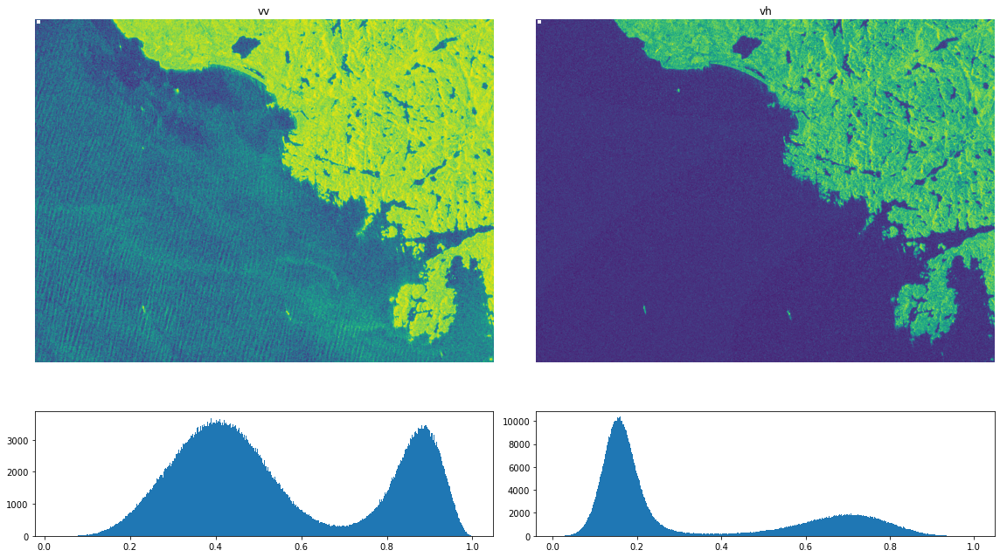

<ipython-input-15-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



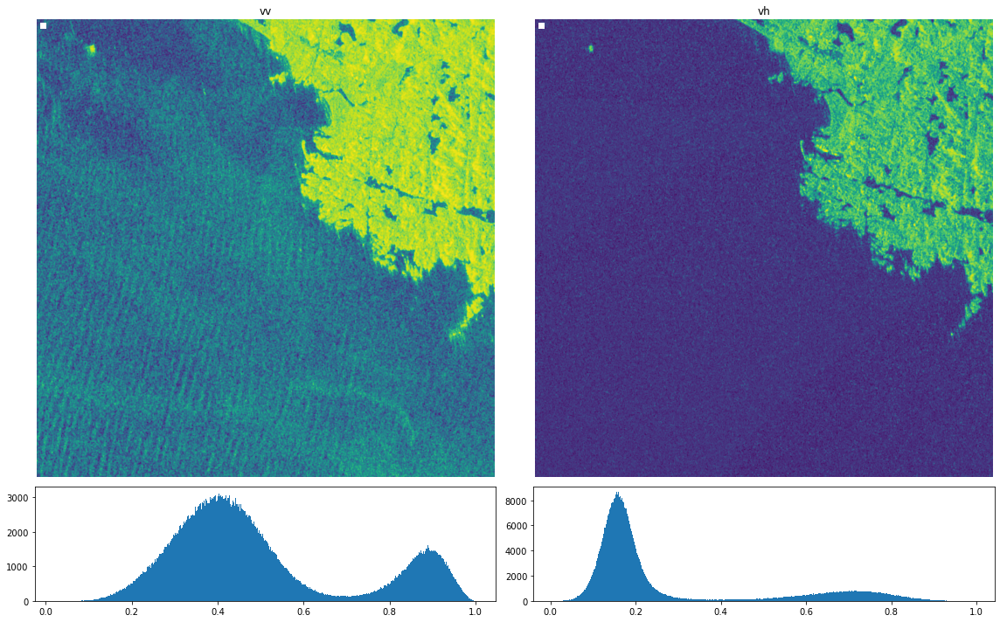

In [23]:
augmented = sigmoid_normalization(noise(image=np.dstack([vv,vh]))["image"])
image_hist(augmented[..., 0], augmented[..., 1])

<ipython-input-2-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



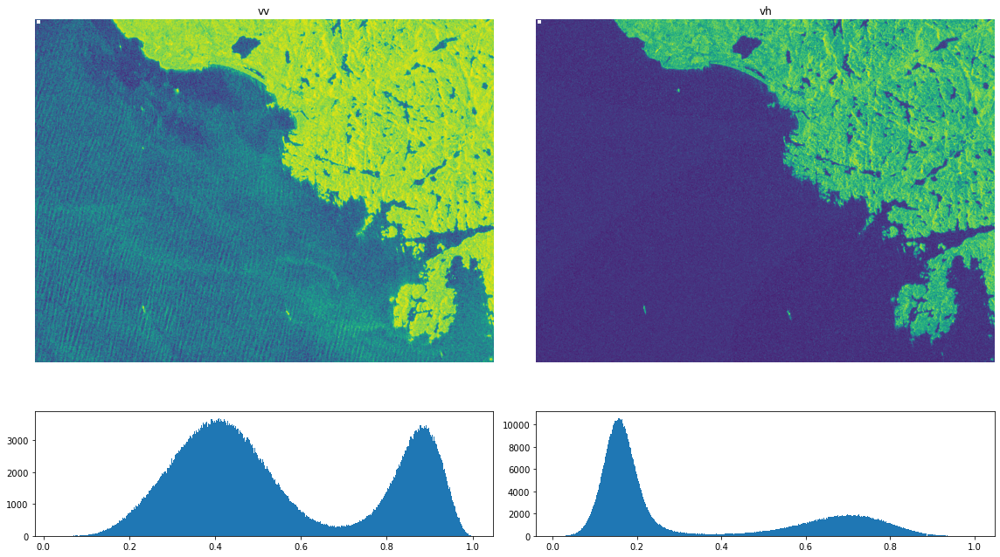

<ipython-input-15-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



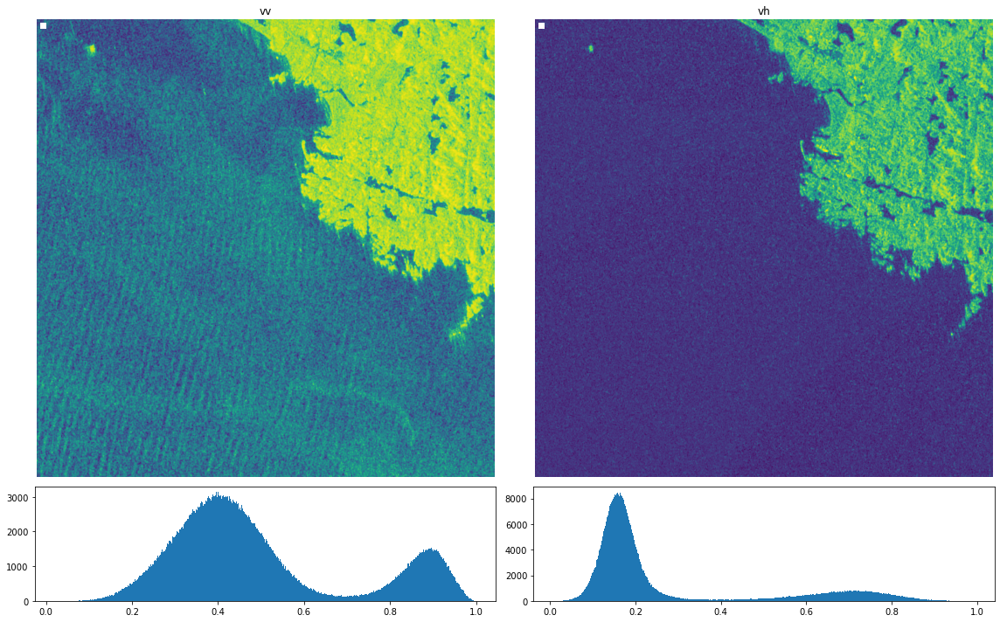

In [24]:
augmented = sigmoid_normalization(noise(image=np.dstack([vv,vh]))["image"])
image_hist(augmented[..., 0], augmented[..., 1])

<ipython-input-2-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



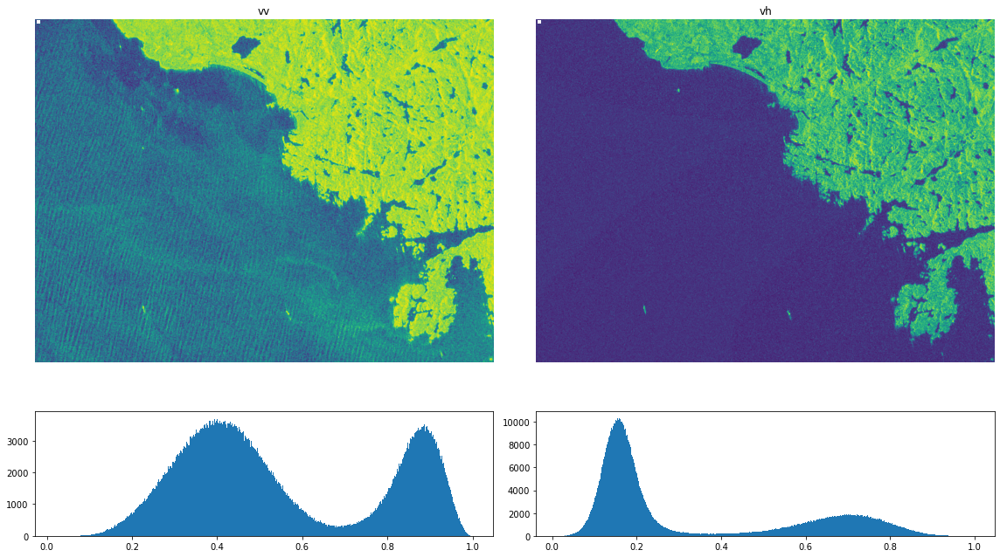

<ipython-input-15-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



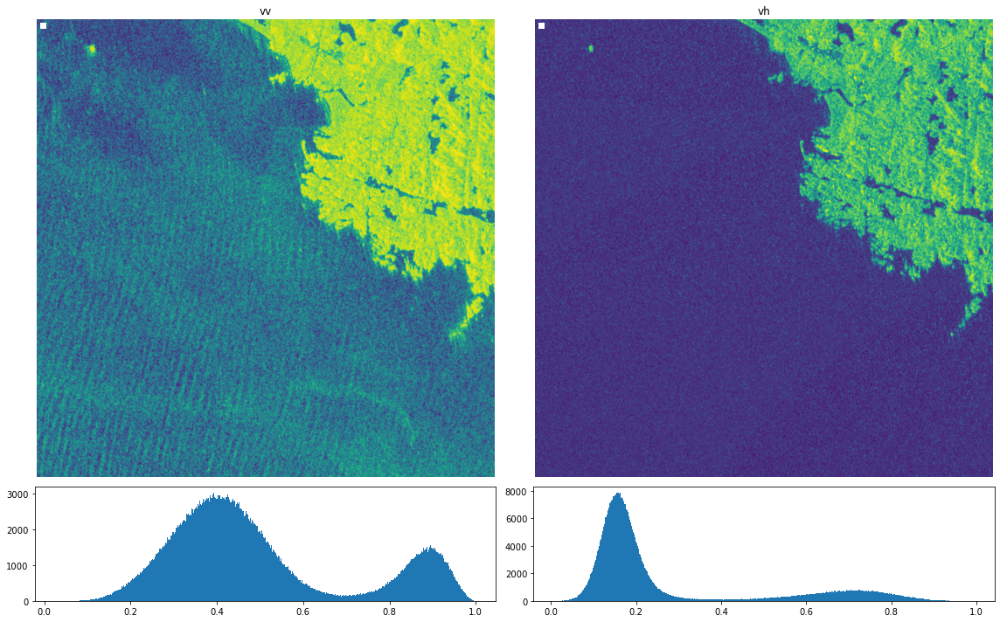

In [25]:
augmented = sigmoid_normalization(noise(image=np.dstack([vv,vh]))["image"])
image_hist(augmented[..., 0], augmented[..., 1])

<ipython-input-2-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



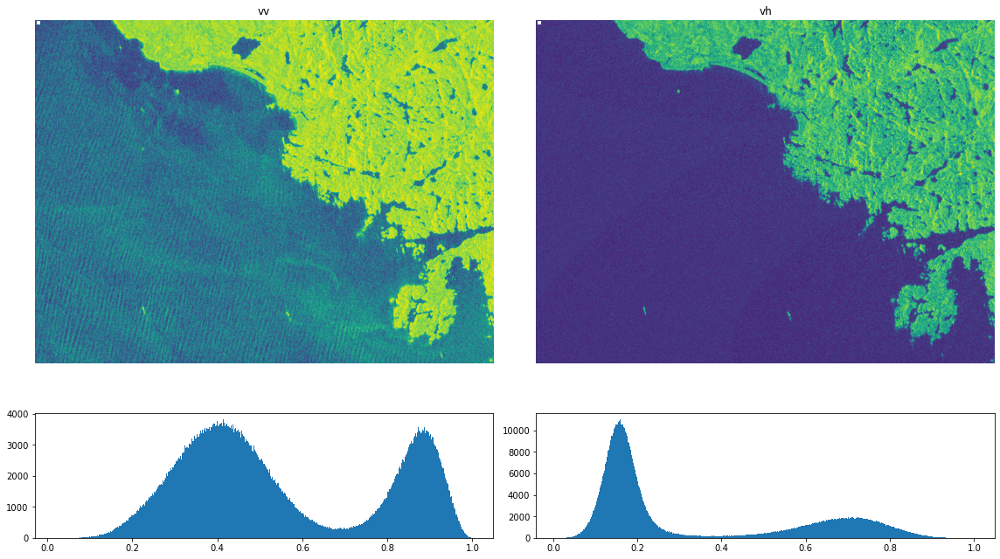

<ipython-input-15-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



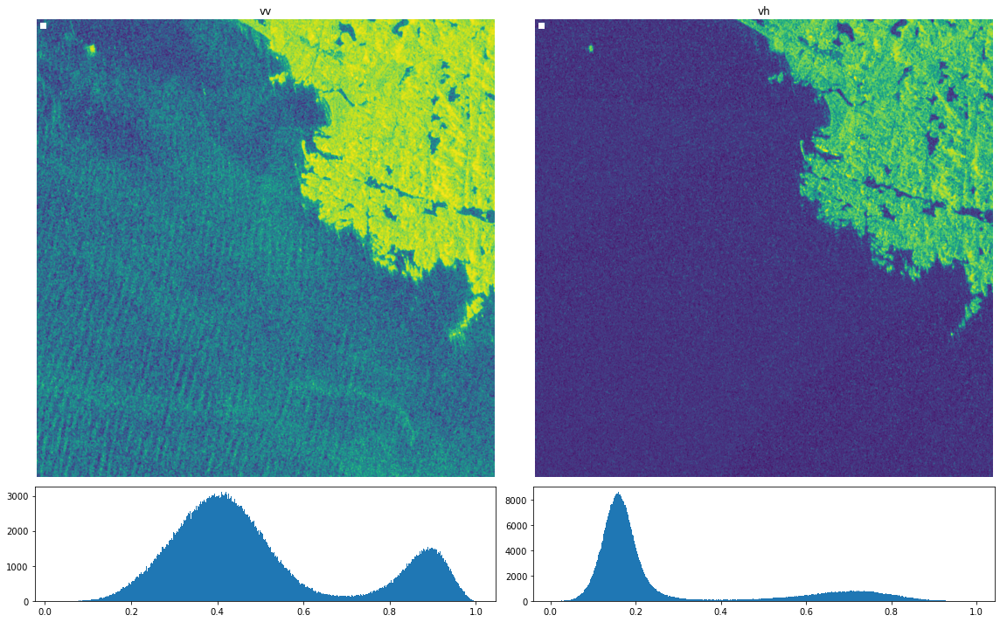

In [26]:
augmented = sigmoid_normalization(noise(image=np.dstack([vv,vh]))["image"])
image_hist(augmented[..., 0], augmented[..., 1])

